### RF-Spliting the dataset into 16 experiment training, 2 testing.

1. Load the dataset and inspect its structure.
2. Split the data into training (16 experiments) and testing (2 experiments) sets.
3. Train a Random Forest classifier using the training data.
4. Predict corrosion and its uncertainty using the trained model on the test data.
5. Visualize the results, particularly focusing on uncertainty mapping.

In [5]:
import pandas as pd

corrosion_data = pd.read_excel("open_crosion.xlsx")
corrosion_data.head()

,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Label,Experiment,X-Coordinate,Y-Coordinate,Specimen
0,-0.793526,-0.564884,-0.918486,-2.643592,-0.405808,1.555672,-1.282668,1,5,53.5,40.0,1
1,-1.131818,-0.564884,-0.934511,-2.750356,-0.279310,1.275645,-2.688708,1,5,54.0,30.5,1
2,-1.120734,-0.564884,-0.951459,-2.863264,-0.298150,1.378301,-2.487164,1,5,54.0,31.0,1
3,-1.106464,-0.564884,-0.968407,-2.976173,-0.316991,1.480956,-2.505143,1,5,54.0,31.5,1
4,-1.090652,-0.564884,-0.985354,-3.089081,-0.335831,1.583612,-2.578003,1,5,54.0,32.0,1


 ## we'll use 16 experiments for training and 2 experiments for testing. 

In [6]:
import numpy as np

unique_experiments = corrosion_data['Experiment'].unique()

# Randomly select 2 experiments for testing
np.random.seed(42)  # for reproducibility
test_experiments = np.random.choice(unique_experiments, 2, replace=False)

train_data = corrosion_data[~corrosion_data['Experiment'].isin(test_experiments)]
test_data = corrosion_data[corrosion_data['Experiment'].isin(test_experiments)]

test_experiments #Experiments 5 and 6 have been selected for testing.


array([5, 6], dtype=int64)

In [7]:
from sklearn.ensemble import RandomForestClassifier

X_train = train_data[['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']]
y_train = train_data['Label']

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

Next, we'll use the trained model to predict corrosion on the test data from Experiments 5 and 6. Additionally, to map the uncertainty, we'll leverage the probabilistic predictions from the Random Forest model, which gives the probability of each class.

In [7]:
# Define test features
X_test = test_data[['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']]

# Predict the labels and their associated probabilities for the test set
predicted_labels = rf_classifier.predict(X_test)
predicted_probs = rf_classifier.predict_proba(X_test)

# Extract the probability of being class '1' (corrosion)
prob_corrosion = predicted_probs[:, 1]

predicted_labels, prob_corrosion[:5]  # Displaying first 5 probabilities for a sample view


(array([0, 0, 0, ..., 0, 0, 0], dtype=int64),
 array([0.39, 0.46, 0.5 , 0.58, 0.68]))

To visualize the uncertainty, we can map the predicted probabilities for corrosion. Probabilities close to 0.5 indicate higher uncertainty (as the model is unsure which class to predict), while values close to 0 or 1 indicate higher confidence in the prediction.

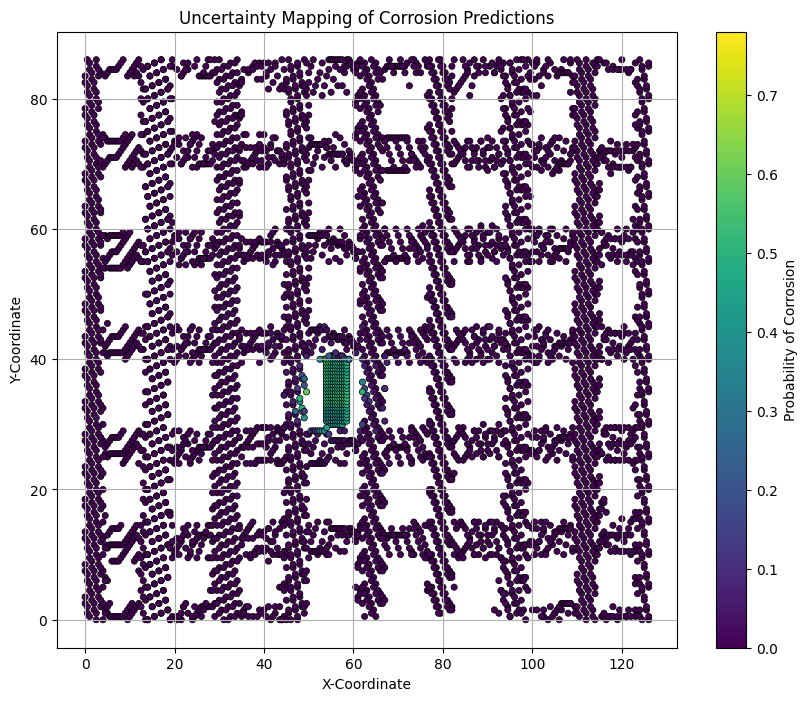

In [8]:
import matplotlib.pyplot as plt

# Extract X and Y coordinates from the test data
x_coords = test_data['X-Coordinate'].values
y_coords = test_data['Y-Coordinate'].values

# Create a scatter plot color-coded by the predicted probabilities
plt.figure(figsize=(10, 8))
sc = plt.scatter(x_coords, y_coords, c=prob_corrosion, cmap='viridis', s=20, edgecolor='k', linewidth=0.5)
plt.colorbar(sc, label='Probability of Corrosion')
plt.xlabel('X-Coordinate')
plt.ylabel('Y-Coordinate')
plt.title('Uncertainty Mapping of Corrosion Predictions')
plt.grid(True)
plt.show()


#### Here's the uncertainty mapping for corrosion predictions:

- The color represents the probability of corrosion. 
- Darker shades indicate higher probabilities of corrosion, while lighter shades indicate lower probabilities.
- Areas with colors close to the midpoint of the color scale (around the yellowish-green region) represent higher uncertainty in predictions. In these areas, the model is less confident about whether corrosion is present or not.
- Conversely, areas with colors on the extremes of the color scale (either dark purple or yellow) represent more confident predictions by the model.

In [13]:
# Define the true labels for the test set
y_test = test_data['Label']

# Calculate precision, recall, and F1-score
precision = precision_score(y_test, predicted_labels)
recall = recall_score(y_test, predicted_labels)
f1 = f1_score(y_test, predicted_labels)

precision, recall, f1


(0.9937888198757764, 0.39119804400978, 0.5614035087719298)

In [14]:
# Extract unique specimens from the test data
unique_specimens_in_test = test_data['Specimen'].unique()
unique_specimens_in_test


array([1], dtype=int64)

In [16]:
# Filter the dataset for rows where "Specimen" is 1
specimen_1_data = corrosion_data[corrosion_data['Specimen'] == 1]

# Group by the "Experiment" column and count corroded points for each experiment
corroded_counts = specimen_1_data.groupby('Experiment')['Label'].sum()

# Identify experiments with corroded points
corroded_experiments_specimen_1 = corroded_counts[corroded_counts > 0].index.tolist()

corroded_experiments_specimen_1


[5, 6, 7, 8, 9]

In [15]:
# Filter the dataset for rows where "Specimen" is 2
specimen_2_data = corrosion_data[corrosion_data['Specimen'] == 2]

# Group by the "Experiment" column and count corroded points for each experiment
corroded_counts = specimen_2_data.groupby('Experiment')['Label'].sum()

# Identify experiments with corroded points
corroded_experiments_specimen_2 = corroded_counts[corroded_counts > 0].index.tolist()

corroded_experiments_specimen_2


[10, 17, 18]

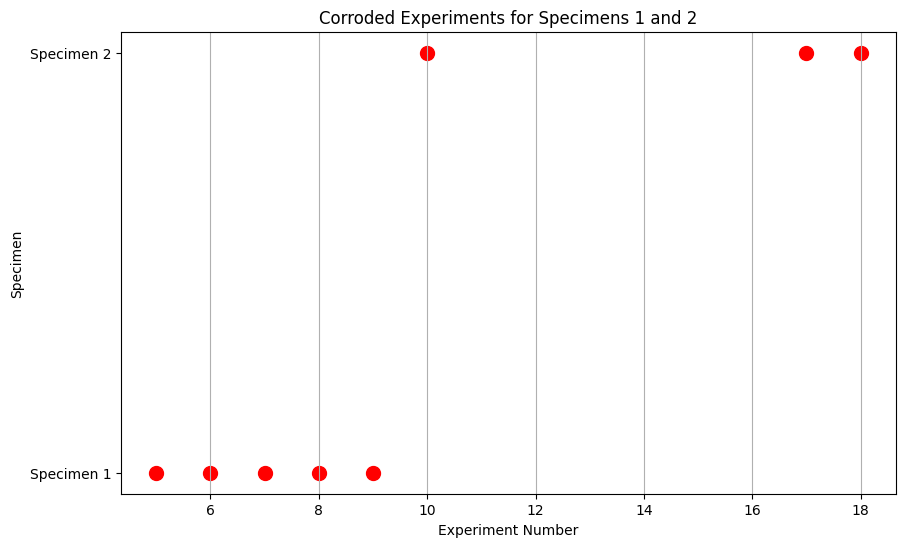

In [18]:
# Update the corroded experiments for Specimen 1 based on the provided code
corroded_experiments_specimen_1 = [5, 6, 7, 8, 9]

# Data for the updated plot
x_values = corroded_experiments_specimen_1 + corroded_experiments_specimen_2
y_values = [1] * len(corroded_experiments_specimen_1) + [2] * len(corroded_experiments_specimen_2)

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(x_values, y_values, color='red', s=100)
plt.yticks([1, 2], ['Specimen 1', 'Specimen 2'])
plt.xlabel('Experiment Number')
plt.ylabel('Specimen')
plt.title('Corroded Experiments for Specimens 1 and 2')
plt.grid(True, axis='x')
plt.show()


1. For Specimen 1: Experiments 5, 6, 7, 8, and 9 are corroded.
2. For Specimen 2: Experiments 10, 17, and 18 are corroded.

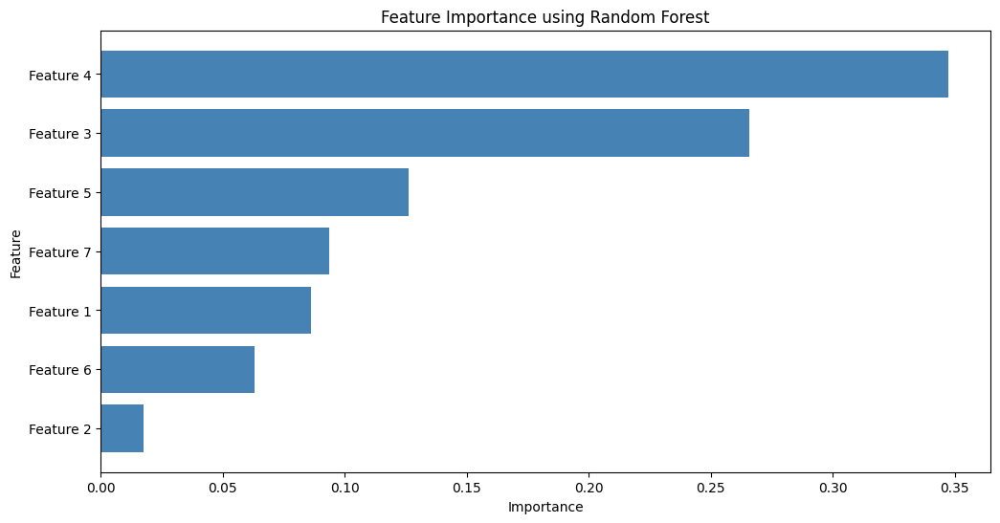

In [2]:
# Extract feature importances from the trained Random Forest model
feature_importances = rf_classifier.feature_importances_

# Features
features = X_train.columns

# Create a DataFrame for visualization
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='steelblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance using Random Forest')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


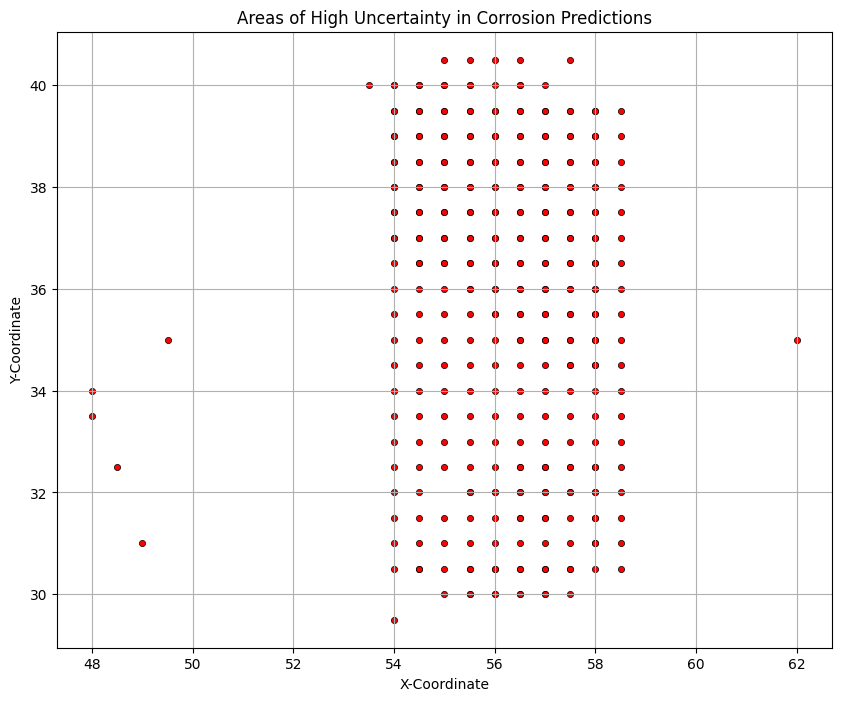

The number of uncertain points 323


In [1]:
# Reloading necessary libraries and data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# Load the dataset
corrosion_data = pd.read_excel("open_crosion.xlsx")

# Split the data into training and testing sets based on the selected experiments
test_experiments = [5, 6]
train_data = corrosion_data[~corrosion_data['Experiment'].isin(test_experiments)]
test_data = corrosion_data[corrosion_data['Experiment'].isin(test_experiments)]

# Define features and target variable and train the Random Forest classifier
X_train = train_data[['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']]
y_train = train_data['Label']
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

# Define test features and predict the labels and their associated probabilities for the test set
X_test = test_data[['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']]
predicted_probs = rf_classifier.predict_proba(X_test)
prob_corrosion = predicted_probs[:, 1]

# Determine a probability range that represents high uncertainty and filter out data points that fall within this range
uncertainty_thresholds = (0.4, 0.6)
uncertain_points = test_data[(prob_corrosion >= uncertainty_thresholds[0]) & (prob_corrosion <= uncertainty_thresholds[1])]

# Create the scatter plot for areas of high uncertainty
plt.figure(figsize=(10, 8))
plt.scatter(uncertain_points['X-Coordinate'], uncertain_points['Y-Coordinate'], c='red', s=20, edgecolor='k', linewidth=0.5)
plt.xlabel('X-Coordinate')
plt.ylabel('Y-Coordinate')
plt.title('Areas of High Uncertainty in Corrosion Predictions')
plt.grid(True)
plt.show()

# Return the number of uncertain points
print('The number of uncertain points', len(uncertain_points))


### Group_K-fold
For grouped k-fold cross-validation, we'll use the GroupKFold method from sklearn.model_selection. This method ensures that the same group (in our case, the same experiment) is not represented in both the training and test sets.

Here's how we'll proceed:

- Instantiate the GroupKFold object with k splits.
- Loop through the train-test splits provided by GroupKFold.
- For each split, train a Random Forest model and evaluate its performance on the test set.
- Collect the performance metrics (e.g., accuracy, precision, recall) for each fold.
- Compute the average performance across all folds.

In [7]:
from sklearn.model_selection import GroupKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Number of splits
n_splits = 5

# Instantiate GroupKFold
group_kfold = GroupKFold(n_splits=n_splits)

# Features and labels for the entire dataset
X = corrosion_data[['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']]
y = corrosion_data['Label']
groups = corrosion_data['Experiment']

# Lists to store performance metrics
accuracies = []
precisions = []
recalls = []
f1_scores = []

# Loop through each fold
for train_index, test_index in group_kfold.split(X, y, groups):
    # Split data
    X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Train Random Forest classifier
    rf_classifier_fold = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_classifier_fold.fit(X_train_fold, y_train_fold)
    
    # Predictions
    predicted_labels_fold = rf_classifier_fold.predict(X_test_fold)
    
    # Store performance metrics
    accuracies.append(accuracy_score(y_test_fold, predicted_labels_fold))
    precisions.append(precision_score(y_test_fold, predicted_labels_fold))
    recalls.append(recall_score(y_test_fold, predicted_labels_fold))
    f1_scores.append(f1_score(y_test_fold, predicted_labels_fold))

# Average performance metrics
avg_accuracy = np.mean(accuracies)
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)
avg_f1 = np.mean(f1_scores)

avg_accuracy, avg_precision, avg_recall, avg_f1


(0.9722703047736336,
 0.8324108942903876,
 0.37031105989012925,
 0.46263515375620157)

In [8]:
# Lists to store experiments used for training and testing in each fold
train_experiments = []
test_experiments = []

# Loop through each fold to capture the experiments used for training and testing
for train_index, test_index in group_kfold.split(X, y, groups):
    train_experiments_fold = groups.iloc[train_index].unique()
    test_experiments_fold = groups.iloc[test_index].unique()
    
    train_experiments.append(train_experiments_fold)
    test_experiments.append(test_experiments_fold)

train_experiments, test_experiments


([array([ 5,  6,  7,  9, 10, 17, 18,  1,  2,  3,  4, 13, 14, 16],
        dtype=int64),
  array([ 5,  6,  7,  8,  9, 10, 17,  1,  3, 11, 12, 13, 14, 15],
        dtype=int64),
  array([ 5,  6,  8, 10, 17, 18,  1,  2,  4, 11, 12, 13, 15, 16],
        dtype=int64),
  array([ 6,  7,  8,  9, 17, 18,  2,  3,  4, 11, 12, 13, 14, 15, 16],
        dtype=int64),
  array([ 5,  7,  8,  9, 10, 18,  1,  2,  3,  4, 11, 12, 14, 15, 16],
        dtype=int64)],
 [array([ 8, 11, 12, 15], dtype=int64),
  array([18,  2,  4, 16], dtype=int64),
  array([ 7,  9,  3, 14], dtype=int64),
  array([ 5, 10,  1], dtype=int64),
  array([ 6, 17, 13], dtype=int64)])

### Fold 1:

- Training: Experiments [5, 6, 7, 9, 10, 17, 18, 1, 2, 3, 4, 13, 14, 16]
- Testing: Experiments [8, 11, 12, 15]

### Fold 2:

- Training: Experiments [5, 6, 7, 8, 9, 10, 17, 1, 3, 11, 12, 13, 14, 15]
- Testing: Experiments [18, 2, 4, 16]

### Fold 3:

- Training: Experiments [5, 6, 8, 10, 17, 18, 1, 2, 4, 11, 12, 13, 15, 16]
- Testing: Experiments [7, 9, 3, 14]

### Fold 4:

- Training: Experiments [6, 7, 8, 9, 17, 18, 2, 3, 4, 11, 12, 13, 14, 15, 16]
- Testing: Experiments [5, 10, 1]

### Fold 5:

- Training: Experiments [5, 7, 8, 9, 10, 18, 1, 2, 3, 4, 11, 12, 14, 15, 16]
- Testing: Experiments [6, 17, 13]

For Fold 1:
Accuracy: 0.9664, Precision: 0.2174, Recall: 0.0629, F1-Score: 0.0976
--------------------------------------------------
For Fold 2:
Accuracy: 0.9957, Precision: 0.9722, Recall: 0.8367, F1-Score: 0.8994
--------------------------------------------------
For Fold 3:
Accuracy: 0.9581, Precision: 1.0000, Recall: 0.0455, F1-Score: 0.0871
--------------------------------------------------
For Fold 4:
Accuracy: 0.9660, Precision: 1.0000, Recall: 0.3600, F1-Score: 0.5294
--------------------------------------------------
For Fold 5:
Accuracy: 0.9750, Precision: 0.9724, Recall: 0.5465, F1-Score: 0.6997
--------------------------------------------------


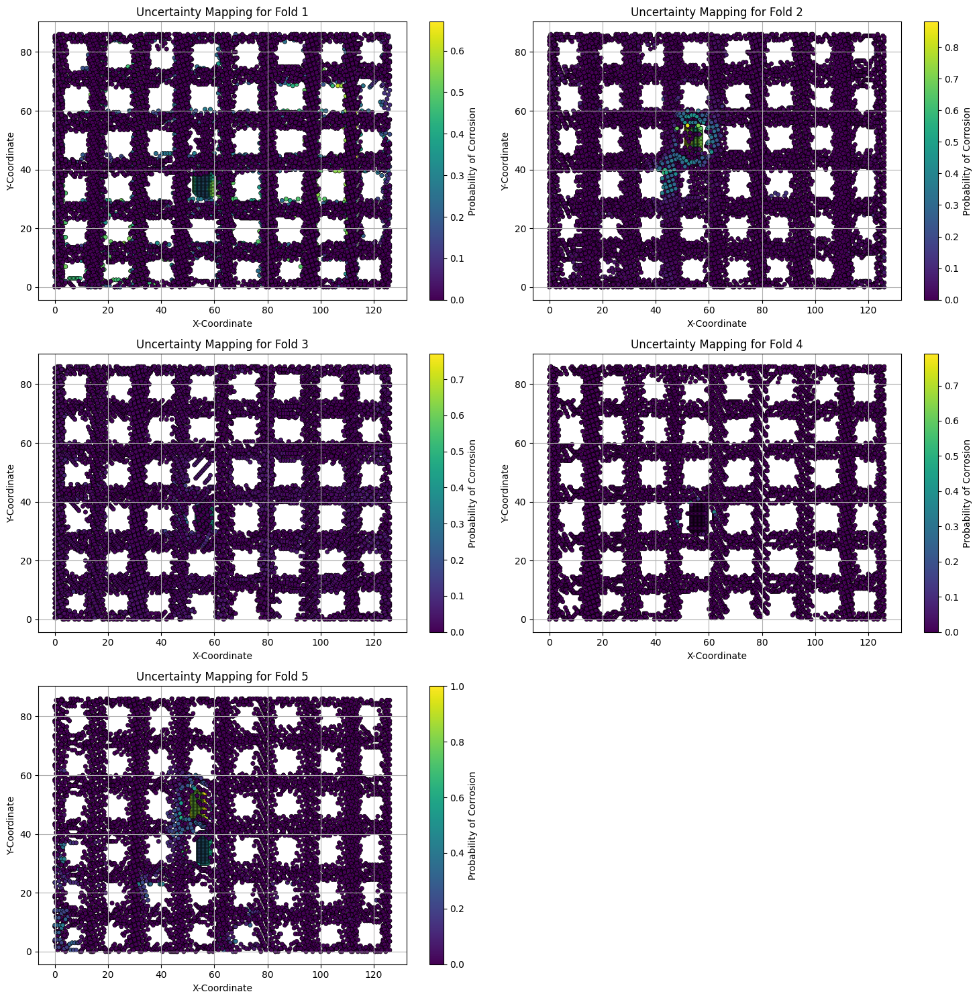

In [10]:
from sklearn.model_selection import GroupKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Number of splits
n_splits = 5

# Instantiate GroupKFold
group_kfold = GroupKFold(n_splits=n_splits)

# Features and labels for the entire dataset
X = corrosion_data[['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']]
y = corrosion_data['Label']
groups = corrosion_data['Experiment']

# Lists to store performance metrics
accuracies = []
precisions = []
recalls = []
f1_scores = []



# Lists to store performance metrics for each fold
all_accuracies = []
all_precisions = []
all_recalls = []
all_f1_scores = []

# List to store predicted probabilities for each fold for plotting
all_prob_corrosions = []
all_x_coords = []
all_y_coords = []

# Loop through each fold, train the model, make predictions, compute metrics, and plot
for i, (train_index, test_index) in enumerate(group_kfold.split(X, y, groups)):
    # Split data
    X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Train Random Forest classifier
    rf_classifier_fold = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_classifier_fold.fit(X_train_fold, y_train_fold)
    
    # Predictions
    predicted_labels_fold = rf_classifier_fold.predict(X_test_fold)
    predicted_probs_fold = rf_classifier_fold.predict_proba(X_test_fold)
    
    # Check if predicted_probs_fold has 2 columns (to avoid the previous error we encountered)
    if predicted_probs_fold.shape[1] == 2:
        prob_corrosion_fold = predicted_probs_fold[:, 1]
    else:
        prob_corrosion_fold = np.zeros_like(y_test_fold) if unique_predicted_labels[0] == 0 else np.ones_like(y_test_fold)
    
    all_prob_corrosions.append(prob_corrosion_fold)
    all_x_coords.append(corrosion_data.iloc[test_index]['X-Coordinate'].values)
    all_y_coords.append(corrosion_data.iloc[test_index]['Y-Coordinate'].values)
    
    # Compute performance metrics
    accuracy = accuracy_score(y_test_fold, predicted_labels_fold)
    precision = precision_score(y_test_fold, predicted_labels_fold)
    recall = recall_score(y_test_fold, predicted_labels_fold)
    f1 = f1_score(y_test_fold, predicted_labels_fold)
    
    all_accuracies.append(accuracy)
    all_precisions.append(precision)
    all_recalls.append(recall)
    all_f1_scores.append(f1)
    
    # Print metrics
    print(f"For Fold {i+1}:")
    print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f}")
    print("-" * 80)

# Plot the uncertainty for each fold
plt.figure(figsize=(15, 15))
for i in range(n_splits):
    plt.subplot(3, 2, i+1)
    sc = plt.scatter(all_x_coords[i], all_y_coords[i], c=all_prob_corrosions[i], cmap='viridis', s=20, edgecolor='k', linewidth=0.5)
    plt.colorbar(sc, label='Probability of Corrosion')
    plt.xlabel('X-Coordinate')
    plt.ylabel('Y-Coordinate')
    plt.title(f'Uncertainty Mapping for Fold {i+1}')
    plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
# Given data
folds = [f"Fold {i+1}" for i in range(n_splits)]
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Values
values = [all_accuracies, all_precisions, all_recalls, all_f1_scores]

# Plotting
x = np.arange(len(folds))  # the fold labels locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(12, 7))
for i, (metric, value) in enumerate(zip(metrics, values)):
    ax.bar(x + i*width, value, width, label=metric)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Fold')
ax.set_ylabel('Score')
ax.set_title('Scores by Fold and Metric')
ax.set_xticks(x + width*(len(metrics)-1)/2)
ax.set_xticklabels(folds)
ax.legend()

ax.set_ylim([0, 1.1])  # Setting y-axis limits to [0, 1.1] to better visualize percentages
plt.tight_layout()
plt.grid(axis='y')
plt.show()


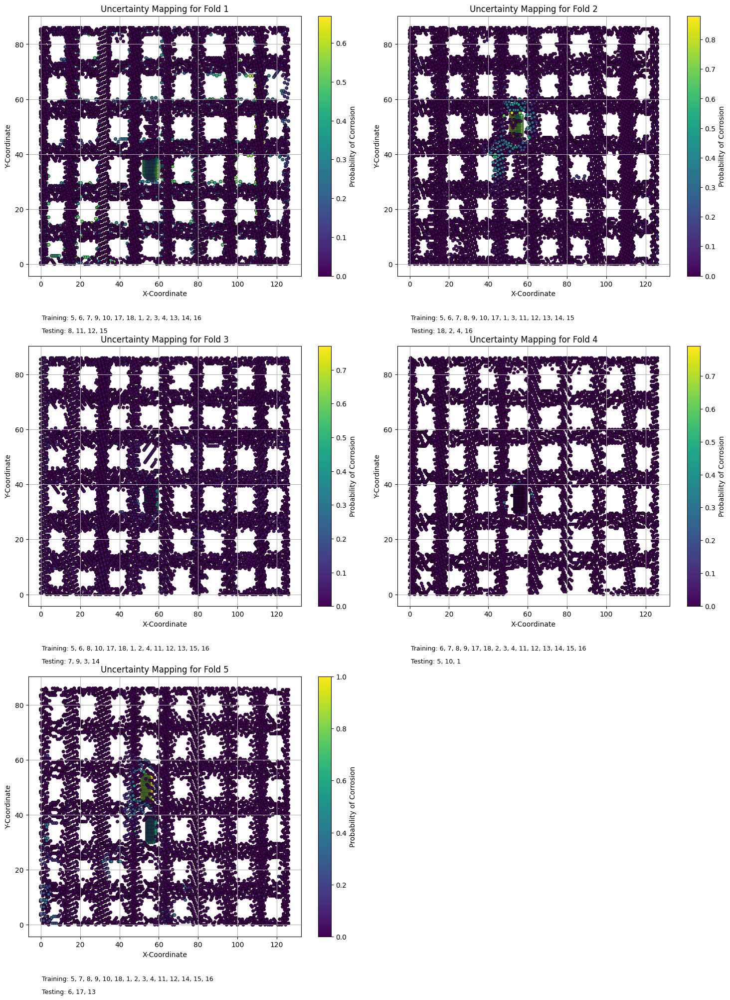

In [12]:
# Plotting the uncertainty with repositioned labels
plt.figure(figsize=(15, 20))
for i in range(n_splits):
    plt.subplot(3, 2, i+1)
    sc = plt.scatter(all_x_coords[i], all_y_coords[i], c=all_prob_corrosions[i], cmap='viridis', s=20, edgecolor='k', linewidth=0.5)
    plt.colorbar(sc, label='Probability of Corrosion')
    plt.xlabel('X-Coordinate')
    plt.ylabel('Y-Coordinate')
    plt.title(f'Uncertainty Mapping for Fold {i+1}')
    
    # Adding the label with training and testing experiments
    train_exp_text = "Training: " + ", ".join(map(str, train_experiments[i]))
    test_exp_text = "Testing: " + ", ".join(map(str, test_experiments[i]))
    
    # Repositioning the text below the x-axis
    plt.text(0.05, -0.15, train_exp_text, transform=plt.gca().transAxes, fontsize=9, va='top')
    plt.text(0.05, -0.20, test_exp_text, transform=plt.gca().transAxes, fontsize=9, va='top')
    
    plt.grid(True)

plt.tight_layout()
plt.show()


RF - SMOTE

c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


For Fold 1:
Accuracy: 0.9711, Precision: 0.0000, Recall: 0.0000, F1-Score: 0.0000
--------------------------------------------------------------------------------
For Fold 2:
Accuracy: 0.9967, Precision: 0.9736, Recall: 0.8805, F1-Score: 0.9247
--------------------------------------------------------------------------------
For Fold 3:
Accuracy: 0.9588, Precision: 0.8085, Recall: 0.0787, F1-Score: 0.1434
--------------------------------------------------------------------------------
For Fold 4:
Accuracy: 0.9603, Precision: 0.9669, Recall: 0.2600, F1-Score: 0.4098
--------------------------------------------------------------------------------
For Fold 5:
Accuracy: 0.9725, Precision: 0.9698, Recall: 0.4978, F1-Score: 0.6579
--------------------------------------------------------------------------------


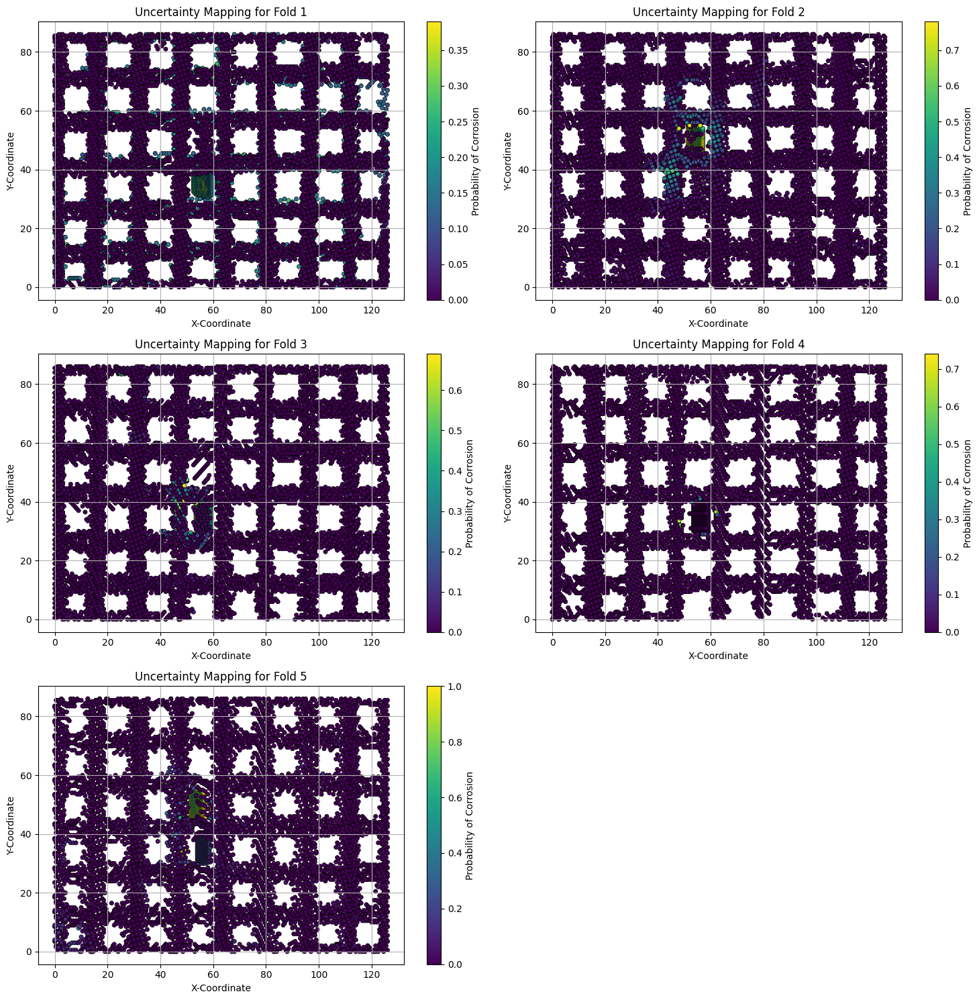

In [9]:
from imblearn.over_sampling import SMOTE
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Number of splits
n_splits = 5

# Instantiate GroupKFold
group_kfold = GroupKFold(n_splits=n_splits)

# Features and labels for the entire dataset
X = corrosion_data[['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']]
y = corrosion_data['Label']
groups = corrosion_data['Experiment']

# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Lists to store performance metrics for each fold
all_accuracies = []
all_precisions = []
all_recalls = []
all_f1_scores = []

# List to store predicted probabilities for each fold for plotting
all_prob_corrosions = []
all_x_coords = []
all_y_coords = []

# Loop through each fold, train the model, make predictions, compute metrics, and plot
for i, (train_index, test_index) in enumerate(group_kfold.split(X, y, groups)):
    # Split data
    X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]

    # Apply SMOTE to the training data
    X_train_fold, y_train_fold = smote.fit_resample(X_train_fold, y_train_fold)
    
    # Train Random Forest classifier
    rf_classifier_fold = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_classifier_fold.fit(X_train_fold, y_train_fold)
    
    # Predictions
    predicted_labels_fold = rf_classifier_fold.predict(X_test_fold)
    predicted_probs_fold = rf_classifier_fold.predict_proba(X_test_fold)
    
    # Check if predicted_probs_fold has 2 columns (to avoid the previous error we encountered)
    if predicted_probs_fold.shape[1] == 2:
        prob_corrosion_fold = predicted_probs_fold[:, 1]
    else:
        prob_corrosion_fold = np.zeros_like(y_test_fold) if unique_predicted_labels[0] == 0 else np.ones_like(y_test_fold)
    
    all_prob_corrosions.append(prob_corrosion_fold)
    all_x_coords.append(corrosion_data.iloc[test_index]['X-Coordinate'].values)
    all_y_coords.append(corrosion_data.iloc[test_index]['Y-Coordinate'].values)
    
    # Compute performance metrics
    accuracy = accuracy_score(y_test_fold, predicted_labels_fold)
    precision = precision_score(y_test_fold, predicted_labels_fold)
    recall = recall_score(y_test_fold, predicted_labels_fold)
    f1 = f1_score(y_test_fold, predicted_labels_fold)
    
    all_accuracies.append(accuracy)
    all_precisions.append(precision)
    all_recalls.append(recall)
    all_f1_scores.append(f1)
    
    # Print metrics
    print(f"For Fold {i+1}:")
    print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f}")
    print("-" * 80)

# Plot the uncertainty for each fold
plt.figure(figsize=(15, 15))
for i in range(n_splits):
    plt.subplot(3, 2, i+1)
    sc = plt.scatter(all_x_coords[i], all_y_coords[i], c=all_prob_corrosions[i], cmap='viridis', s=20, edgecolor='k', linewidth=0.5)
    plt.colorbar(sc, label='Probability of Corrosion')
    plt.xlabel('X-Coordinate')
    plt.ylabel('Y-Coordinate')
    plt.title(f'Uncertainty Mapping for Fold {i+1}')
    plt.grid(True)

plt.tight_layout()
plt.show()



SMOTE with undersampling, we can use the SMOTEENN or SMOTETomek methods provided by the imblearn library.

c:\Users\gzia\Documents\GitHub\reincarnate_wp2\.wp2\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


For Fold 1:
Accuracy: 0.9711, Precision: 0.0000, Recall: 0.0000, F1-Score: 0.0000
--------------------------------------------------------------------------------
For Fold 2:
Accuracy: 0.9966, Precision: 0.9213, Recall: 0.9323, F1-Score: 0.9267
--------------------------------------------------------------------------------
For Fold 3:
Accuracy: 0.9628, Precision: 0.8687, Recall: 0.1781, F1-Score: 0.2955
--------------------------------------------------------------------------------
For Fold 4:
Accuracy: 0.9693, Precision: 0.9750, Recall: 0.4333, F1-Score: 0.6000
--------------------------------------------------------------------------------
For Fold 5:
Accuracy: 0.9723, Precision: 0.9657, Recall: 0.4978, F1-Score: 0.6569
--------------------------------------------------------------------------------


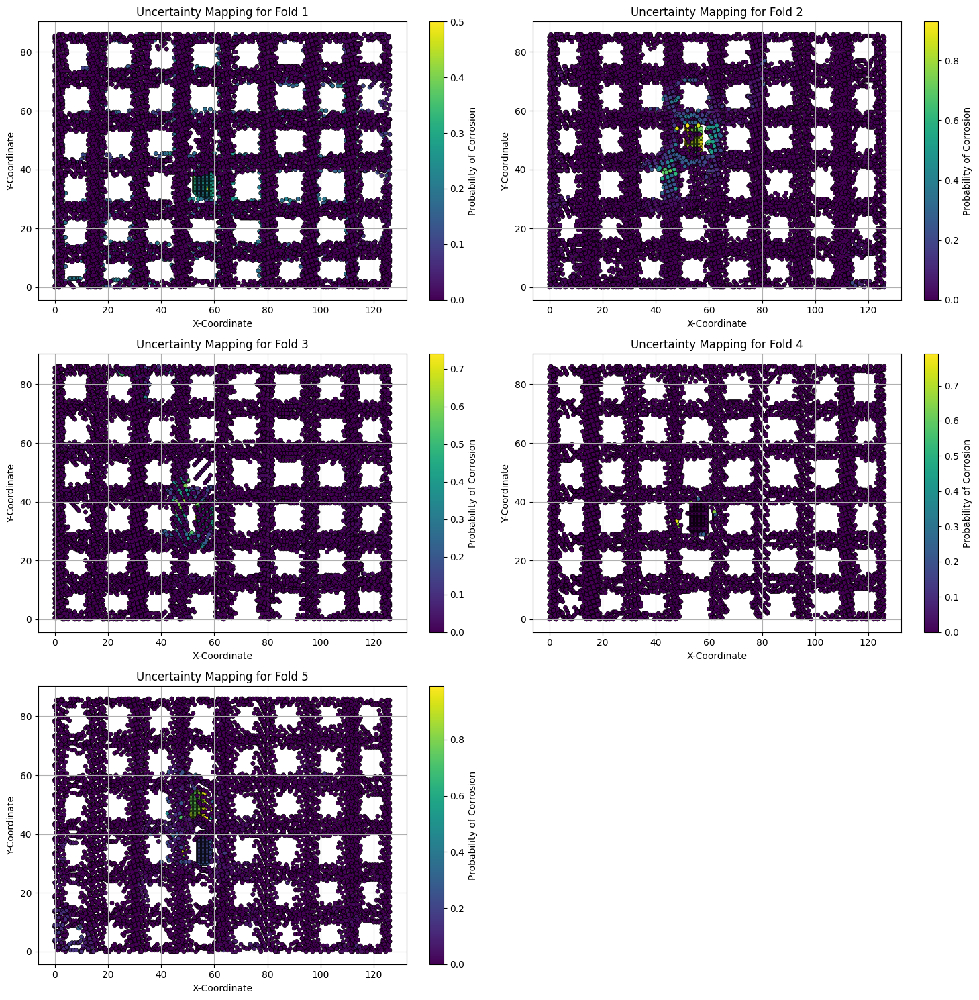

In [10]:
from imblearn.combine import SMOTEENN
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt

n_splits = 5


# Lists to store performance metrics for each fold
all_accuracies = []
all_precisions = []
all_recalls = []
all_f1_scores = []

# List to store predicted probabilities for each fold for plotting
all_prob_corrosions = []
all_x_coords = []
all_y_coords = []

# Initialize SMOTEENN
smote_enn = SMOTEENN(random_state=42)

# Loop through each fold, train the model, make predictions, compute metrics, and plot
for i, (train_index, test_index) in enumerate(group_kfold.split(X, y, groups)):
    # Split data
    X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]
    
    # Apply SMOTEENN
    X_train_fold_resampled, y_train_fold_resampled = smote_enn.fit_resample(X_train_fold, y_train_fold)
    
    # Train Random Forest classifier
    rf_classifier_fold = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_classifier_fold.fit(X_train_fold_resampled, y_train_fold_resampled)
    
    # Predictions
    predicted_labels_fold = rf_classifier_fold.predict(X_test_fold)
    predicted_probs_fold = rf_classifier_fold.predict_proba(X_test_fold)
    
    # Check if predicted_probs_fold has 2 columns (to avoid the previous error we encountered)
    if predicted_probs_fold.shape[1] == 2:
        prob_corrosion_fold = predicted_probs_fold[:, 1]
    else:
        prob_corrosion_fold = np.zeros_like(y_test_fold) if unique_predicted_labels[0] == 0 else np.ones_like(y_test_fold)
    
    all_prob_corrosions.append(prob_corrosion_fold)
    all_x_coords.append(corrosion_data.iloc[test_index]['X-Coordinate'].values)
    all_y_coords.append(corrosion_data.iloc[test_index]['Y-Coordinate'].values)
    
    # Compute performance metrics
    accuracy = accuracy_score(y_test_fold, predicted_labels_fold)
    precision = precision_score(y_test_fold, predicted_labels_fold)
    recall = recall_score(y_test_fold, predicted_labels_fold)
    f1 = f1_score(y_test_fold, predicted_labels_fold)
    
    all_accuracies.append(accuracy)
    all_precisions.append(precision)
    all_recalls.append(recall)
    all_f1_scores.append(f1)
    
    # Print metrics
    print(f"For Fold {i+1}:")
    print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f}")
    print("-" * 80)

# Plot the uncertainty for each fold
plt.figure(figsize=(15, 15))
for i in range(n_splits):
    plt.subplot(3, 2, i+1)
    sc = plt.scatter(all_x_coords[i], all_y_coords[i], c=all_prob_corrosions[i], cmap='viridis', s=20, edgecolor='k', linewidth=0.5)
    plt.colorbar(sc, label='Probability of Corrosion')
    plt.xlabel('X-Coordinate')
    plt.ylabel('Y-Coordinate')
    plt.title(f'Uncertainty Mapping for Fold {i+1}')
    plt.grid(True)

plt.tight_layout()
plt.show()


In [4]:
# Given data
folds = [f"Fold {i+1}" for i in range(n_splits)]
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

# Values
values = [all_accuracies, all_precisions, all_recalls, all_f1_scores]

# Plotting
x = np.arange(len(folds))  # the fold labels locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(12, 7))
for i, (metric, value) in enumerate(zip(metrics, values)):
    ax.bar(x + i*width, value, width, label=metric)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Fold')
ax.set_ylabel('Score')
ax.set_title('Scores by Fold and Metric')
ax.set_xticks(x + width*(len(metrics)-1)/2)
ax.set_xticklabels(folds)
ax.legend()

ax.set_ylim([0, 1.1])  # Setting y-axis limits to [0, 1.1] to better visualize percentages
plt.tight_layout()
plt.grid(axis='y')
plt.show()


NameError: name 'n_splits' is not defined